# LightGBM Model

Having established the baseline model using logistic regression. Now we try to see how well a gradient-boosted tree model performs, in this case we use Light Gradient-Boosting Machine or LightGBM.
***

### Imports

In [89]:
import sys
import joblib
from pathlib import Path

PROJECT_ROOT = Path.cwd().parent
sys.path.append(str(PROJECT_ROOT))

import lightgbm as lgb
import pandas as pd
import numpy as np
import shap
from sklearn.metrics import accuracy_score, roc_auc_score, classification_report
from sklearn.model_selection import RandomizedSearchCV
from src.time_splits import time_aware_splits

### Load Data

In [90]:
project_root = Path().resolve().parents[0]
sys.path.append(str(project_root))

df_dataset = pd.read_csv(Path(project_root) / "data" / "processed" / "dataset.csv")

### Prepare the Data

In [91]:
# Dropping *_reach_missing as this caused some data leakage issues
X = df_dataset.drop(columns=["date", "winner", "r_reach_missing", "b_reach_missing"])
# One-time hot encode
X_encoded = pd.get_dummies(X, columns=["division", "r_stance", "b_stance"], drop_first=False)
y = df_dataset["winner"]
print(X_encoded.dtypes.unique())

[dtype('float64') dtype('int64') dtype('bool')]


### Split the Data

In [92]:
X_train, X_val, X_test, y_train, y_val, y_test = time_aware_splits(X_encoded, y)

### Find Optimal Hyperparameters

In [93]:
param_dist = {
    "num_leaves": [15, 31, 47, 63, 127],
    "max_depth": [3, 4, 5, 6, 7, 8, -1],
    "min_data_in_leaf": [50, 100, 150, 200, 250, 300, 500],
    "learning_rate": [0.01, 0.03, 0.05, 0.07, 0.09, 0.11],
    "feature_fraction": [0.6, 0.7, 0.8, 0.9, 1.0],
    "feature_fraction_bynode": [0.6, 0.7, 0.8, 0.9, 1.0],
    "bagging_fraction": [0.6, 0.7, 0.8, 0.9, 1.0],
    "bagging_freq": [1, 5, 10],
    "boosting_type": ["gbdt", "dart"],
    "lambda_l1": [0, 0.1, 0.5, 1.0],
    "lambda_l2": [0, 0.1, 0.5, 1.0],
    "min_split_gain": [0, 0.01, 0.05, 0.1],
    "drop_rate": [0.1, 0.2, 0.3, 0.4],
    "max_bin": [63, 127, 255, 511]
}

base_model = lgb.LGBMClassifier(
    objective="binary",
    n_estimators=300,
    random_state=42
)

rand_search = RandomizedSearchCV(
    estimator=base_model,
    param_distributions=param_dist,
    n_iter=200,
    scoring="roc_auc",
    verbose=2,
    random_state=42,
    n_jobs=-1
)

rand_search.fit(X_train, y_train)

best_model = rand_search.best_estimator_
y_val_proba = best_model.predict_proba(X_val)[:, 1]
val_auc = roc_auc_score(y_val, y_val_proba)

print("\nBest Hyperparameters:", rand_search.best_params_)
print("Validation AUC:", val_auc)


Fitting 5 folds for each of 200 candidates, totalling 1000 fits
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] lambda_l1 is set=0.5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] feature_fraction is set=0.9, colsam

### Model Evaluation

In [94]:
X_train_final = np.vstack([X_train, X_val])
y_train_final = np.hstack([y_train, y_val])

# best_model.set_params(n_estimators=500)
best_model.fit(X_train_final, y_train_final)

y_test_proba = best_model.predict_proba(X_test)[:, 1]
test_auc = roc_auc_score(y_test, y_test_proba)

print("Test AUC:", test_auc)

[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] lambda_l1 is set=0.5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] lambda_l1 is set=0.5, reg_alpha=0.0 will be ignored. Cu

### Inspect Features

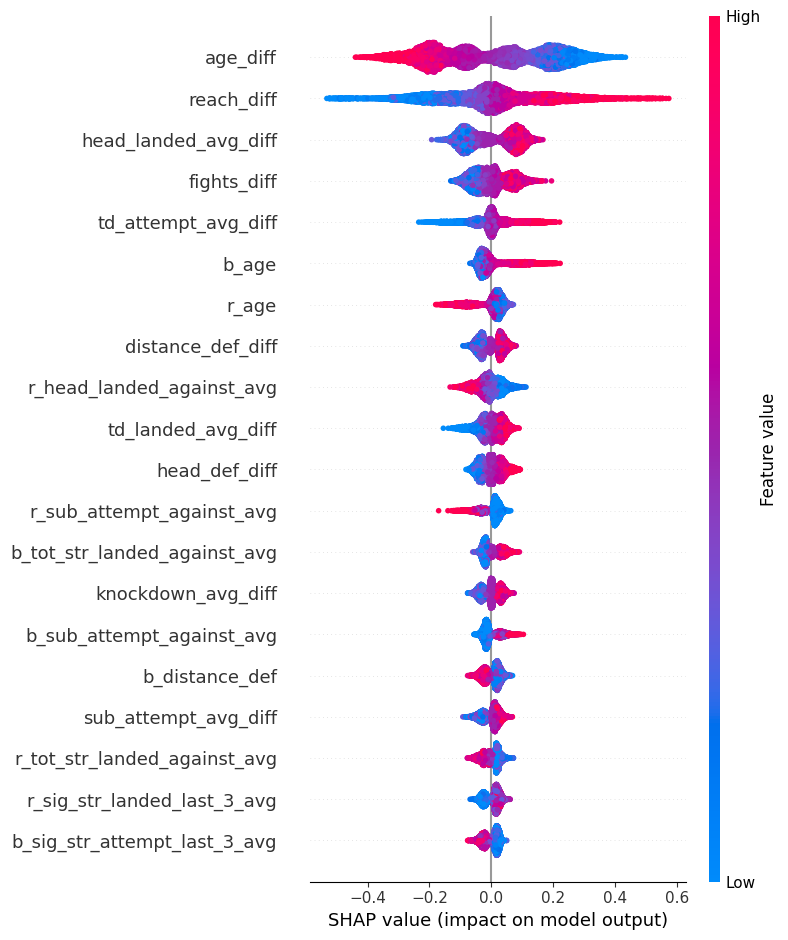

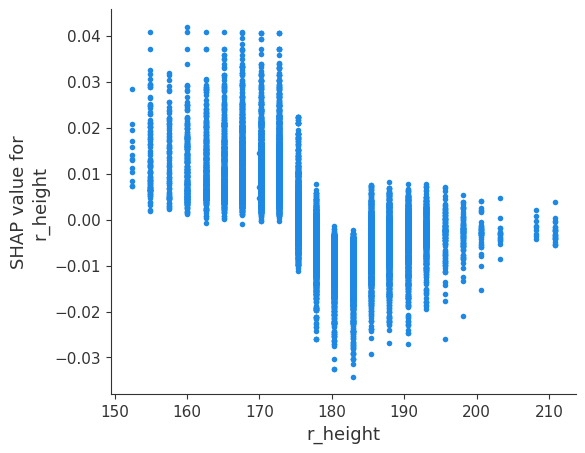

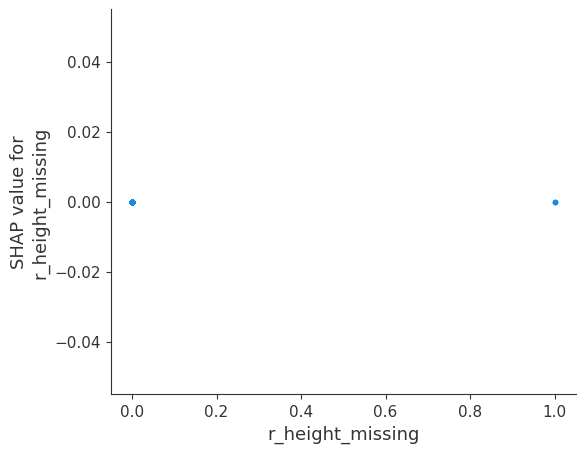

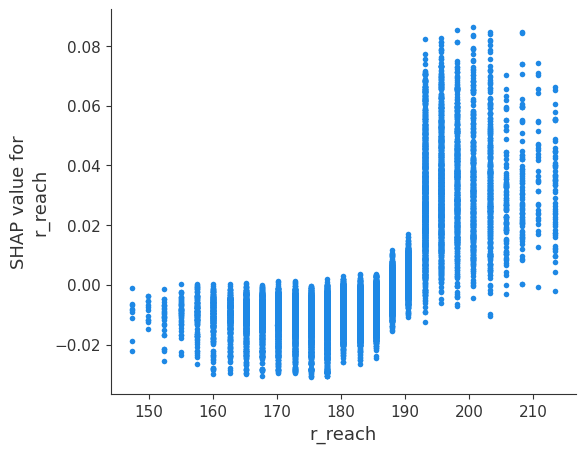

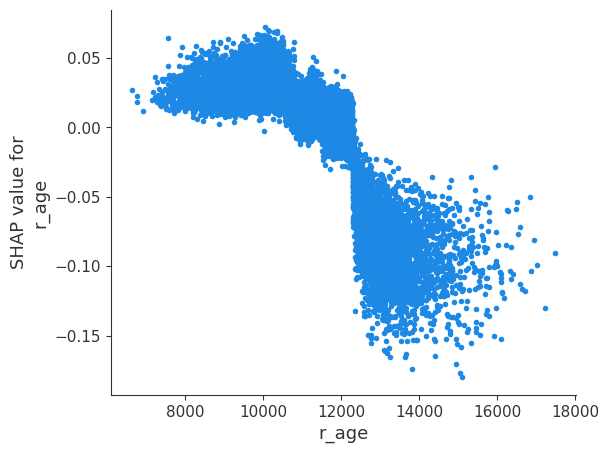

...

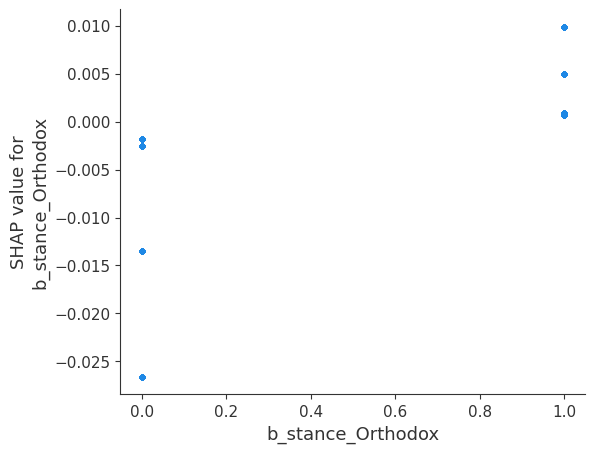

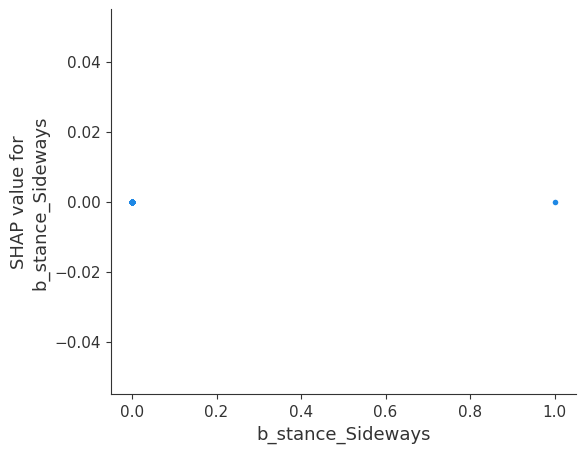

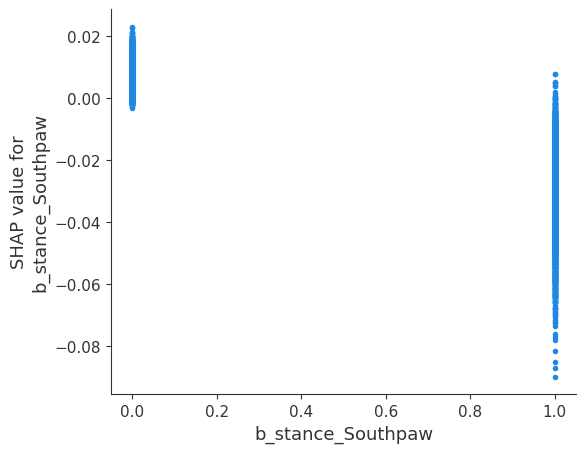

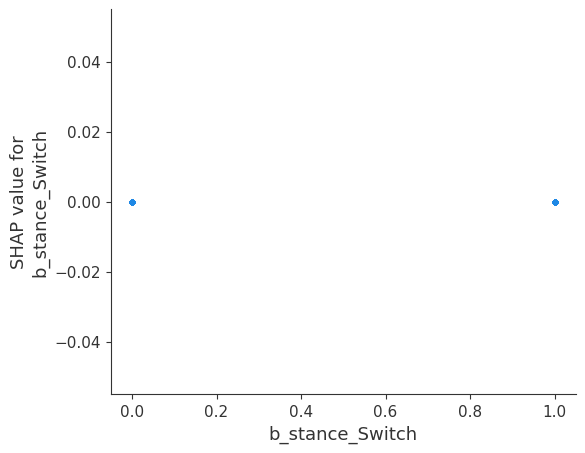

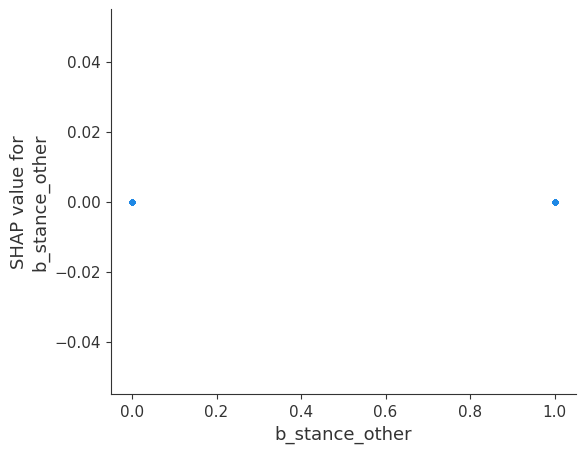

In [95]:
explainer = shap.TreeExplainer(best_model)
shap_values = explainer(X_encoded)
shap.summary_plot(shap_values, X_encoded)
for name in X_train.columns:
    shap.dependence_plot(name, shap_values.values, X_encoded, interaction_index=None)

In [96]:
# Compute mean absolute SHAP value per feature
mean_abs_shap = np.abs(shap_values.values).mean(axis=0)

importance_df = pd.DataFrame({
    "Feature": X_encoded.columns,
    "MeanAbsSHAP": mean_abs_shap
})

most_importance_df = importance_df.sort_values(by="MeanAbsSHAP", ascending=False).head(30) # Take top 20
unimportance_df = importance_df.sort_values(by="MeanAbsSHAP", ascending=False).tail(35) # Take bottom 20ish

print(most_importance_df)
print(unimportance_df)

                          Feature  MeanAbsSHAP
170                      age_diff     0.168231
169                    reach_diff     0.123299
186          head_landed_avg_diff     0.074840
172                   fights_diff     0.047003
182           td_attempt_avg_diff     0.043662
73                          b_age     0.038152
3                           r_age     0.034053
211             distance_def_diff     0.032712
52      r_head_landed_against_avg     0.030168
181            td_landed_avg_diff     0.029561
208                 head_def_diff     0.028731
50      r_sub_attempt_against_avg     0.024752
114  b_tot_str_landed_against_avg     0.024109
204            knockdown_avg_diff     0.023663
120     b_sub_attempt_against_avg     0.022799
133                b_distance_def     0.022334
184          sub_attempt_avg_diff     0.022052
44   r_tot_str_landed_against_avg     0.021959
148   r_sig_str_landed_last_3_avg     0.021683
159  b_sig_str_attempt_last_3_avg     0.021648
188          

### Save the Model

In [97]:
joblib.dump(best_model, Path(project_root) / "models" / "lightGBM.joblib")

['C:\\Users\\nbtur\\OneDrive\\Documents\\UFC-Fight-Outcome-Predictor\\models\\lightGBM.joblib']

### Final Observations

Observations:
- After initally training, validating, and testing SHAP analysis revealed that *_reach_missing dominated feature importance. This lead me to investigate and realize that many fighters who had no listed reach only fought one time and subesequently lost. This intuitively makes sense as back in the early days of the UFC many fighters did not have their stats intially recorded, and as such only mainlining fighters had recorded heights, reaches, etc. This was identified as a form of data leakage. 
- It seems other flags for missing values are on the opposite end from reach_missing, mostly being unused in determining the victor. 
- After fixing that issue, the final model AUC score showed modest improvement over the baseline (0.6410622938241975 vs 0.6542616580875202)
- Once again, we see that difference in fighter age and reach are leading indicators of who will win the fight, as well as new insights like average amount of punched landed to the head and takedown attempts.
- The model could potentially be improved further by adding more features (averages over last 3/5 fights, different combinations of stats, etc.) (Note: upon adding rolling averages over previous 3 fights, no noticable increase was found in the model performance)